In [1]:
%load_ext autoreload
%autoreload 2
# imports
import logging
import sys, os
import time
from tf_pose import common
import cv2
import numpy as np
from tf_pose.estimator import TfPoseEstimator, PoseEstimator
from tf_pose.networks import get_graph_path, model_wh
from tf_pose.common import CocoPart, CocoPairsRender, CocoPairsNetwork
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import asyncio
import datetime
import random
import io

import http.server
import socketserver
import threading
from IPython.display import IFrame
import base64
from PIL import Image
from io import BytesIO
import re
from utils import plot_pose, get_humans_as_lines, plot_human_lines, is_same_image
import tensorflow as tf
import math
import copy
from tqdm import tqdm
import datetime
import pathlib
sys.path.insert(0, os.path.abspath('..'))

from tf_pose.tensblur.smoother import Smoother


os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
logging.getLogger("tensorflow").setLevel(logging.CRITICAL)
logging.getLogger('TfPoseEstimatorRun').setLevel(logging.ERROR)
logging.getLogger('DeepExplain').setLevel(logging.ERROR)
logging.getLogger('TfPoseEstimator').setLevel(logging.ERROR)

/cluster/home/alelidis/.local/lib64/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/cluster/home/alelidis/.local/lib64/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/cluster/home/alelidis/.local/lib64/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/cluster/home/alelidis/.local/lib64/python3.6/site-pack

In [2]:
# the target state
# the loss defined in the paper
def multi_stage_loss(target_heat, target_paf, start_stage=2):
    losses_per_stage = []
    # compute loss per stage
    for stage in range(start_stage, 7): 
        paf_op = estimator.graph.get_operation_by_name(f'TfPoseEstimator/Mconv7_stage{stage}_L1/BiasAdd').outputs[0]
        heat_op = estimator.graph.get_operation_by_name(f'TfPoseEstimator/Mconv7_stage{stage}_L2/BiasAdd').outputs[0]

        # compute the loss for every channel
        loss_paf = tf.nn.l2_loss(tf.concat(paf_op, axis=-1) - tf.concat(target_paf, axis=-1), name='AX_loss_l1_stage%d_' % (stage))
        loss_heat = tf.nn.l2_loss(tf.concat(heat_op, axis=-1) - tf.concat(target_heat, axis=-1), name='AX_loss_l2_stage%d_' % (stage))
        losses_per_stage.append(tf.reduce_sum([loss_paf, loss_heat]))

    # combined loss form every stage
    total_loss = tf.reduce_sum(losses_per_stage)
    summary = tf.summary.scalar('grad_norm', total_loss)

    grad = tf.gradients(total_loss, estimator.tensor_image)[0]
    return grad, summary

def multi_stage_loss_batch(target_heat, target_paf, start_stage=2):
    losses_per_stage = []
    # compute loss per stage
    for stage in range(start_stage, 7): 
        paf_op = estimator.graph.get_operation_by_name(f'TfPoseEstimator/Mconv7_stage{stage}_L1/BiasAdd').outputs[0]
        heat_op = estimator.graph.get_operation_by_name(f'TfPoseEstimator/Mconv7_stage{stage}_L2/BiasAdd').outputs[0]

        # compute the loss for every channel
        loss_paf = tf.nn.l2_loss(tf.concat(paf_op, axis=-1) - tf.concat(target_paf, axis=-1), name='AX_loss_l1_stage%d_' % (stage))
        loss_heat = tf.nn.l2_loss(tf.concat(heat_op, axis=-1) - tf.concat(target_heat, axis=-1), name='AX_loss_l2_stage%d_' % (stage))
        losses_per_stage.append(tf.reduce_sum([loss_paf, loss_heat]))

    # combined loss form every stage
    total_loss = tf.reduce_sum(losses_per_stage)
    summary = tf.summary.scalar('batch_loss', total_loss)

    grad = tf.gradients(total_loss, estimator.tensor_image)[0]
    # compute the average 
    grad = tf.reduce_mean(grad, 0)
    return grad, summary

def print_image_Stats(img):
    print(f'Min: {np.min(img)}')
    print(f'Max: {np.max(img)}')
    print(f'Avg: {np.average(img)}')

# compare two pose and return the total diff and the part switch moved the most
def compare_poses(pose1, pose2):
    total_diff = 0
    cur_max = 0
    most_moved_part = ''
    if(len(pose1.body_parts) != len(pose2.body_parts)):
        print('Poses have different length of body parts')
        return 0, 'NONE'
    for i in pose1.body_parts.keys():
        part1 = pose1.body_parts[i]
        part2 = pose2.body_parts[i]
        part1_pos =  np.array([part1.x, part1.y])
        part2_pos =  np.array([part2.x, part2.y])
        cur_diff = np.linalg.norm(part1_pos - part2_pos)
        if cur_diff > cur_max:
            most_moved_part = part1.get_part_name()
            cur_max = cur_diff
        total_diff += cur_diff
    return total_diff, most_moved_part

# compute the distance of a join between two poses
def compute_distance(pose1, pose2, index):
    if index not in pose1.body_parts or index not in pose2.body_parts:
        print(f'{index} not in both poses found')
        return 0
    part1 = pose1.body_parts[index]
    part2 = pose2.body_parts[index]
    part1_pos =  np.array([part1.x, part1.y])
    part2_pos =  np.array([part2.x, part2.y])
    return np.linalg.norm(part1_pos - part2_pos)

def gen_plot(human_source, human_target, human_adv):
    source_lines = get_humans_as_lines(human_source, 400, 450)
    target_lines = get_humans_as_lines(human_target, 400, 450)
    adv_lines = get_humans_as_lines(human_adv, 400, 450)

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1)

    plot_human_lines(source_lines, ax, color='r', linestyle='-', label='source')
    plot_human_lines(target_lines, ax, color='g', linestyle='-', label='target')
    plot_human_lines(adv_lines, ax, color='b', linestyle='--', label='adv')

    legend_elements = [Line2D([0], [0], color='r', label='source'),
                       Line2D([0], [0], color='g', label='target'),
                       Line2D([0], [0], color='b', label='adverserial')]
    ax.legend(handles=legend_elements, loc='best',  prop={'size': 20})
    buf = io.BytesIO()
    plt.savefig(buf, format='png')
    buf.seek(0)
    return buf

def gen_plot_universal_noise(noise):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(np.clip(noise, 0, 255) / 255)
    buf = io.BytesIO()
    plt.savefig(buf, format='png')
    buf.seek(0)
    return buf

def load_batch(training_paths, start_index, batch_size, width=432, height=368):
    i = start_index
    batch = []
    while len(batch) < batch_size:
        if i >= len(training_paths):
            i = 0
        batch.append(common.read_imgfile(str(training_paths[i]), width, height))
        i += 1
    return np.asarray(batch), i

In [3]:
# params 432, 368
w, h = 432, 368
image_path_target = 'data/images/dri_target_far_2.jpg'
train_dir = 'data/cocoval2017Humans'
model = 'cmu'
log_dir = 'logs/'

resize_out_ratio = 2.0
image_target = common.read_imgfile(image_path_target, w, h)
summary_writer = tf.summary.FileWriter(log_dir + "uniadv/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
training_paths = pathlib.Path(train_dir).glob('*.jpg')
training_paths = sorted([x for x in training_paths])

In [4]:
estimator = TfPoseEstimator(get_graph_path(model), target_size=(w, h), trt_bool=False)
upsample_size = [int(estimator.target_size[1] / 8 * resize_out_ratio), int(estimator.target_size[0] / 8 * resize_out_ratio)]
# get all outputs as np matrix
target_np, target_np_heat, target_np_paf, target_np_peaks = estimator.persistent_sess.run(
            [estimator.tensor_output, estimator.tensor_heatMat_up, estimator.tensor_pafMat_up, estimator.tensor_peaks],
            feed_dict={
                estimator.tensor_image: [image_target],
                estimator.upsample_size: upsample_size
            }
        )

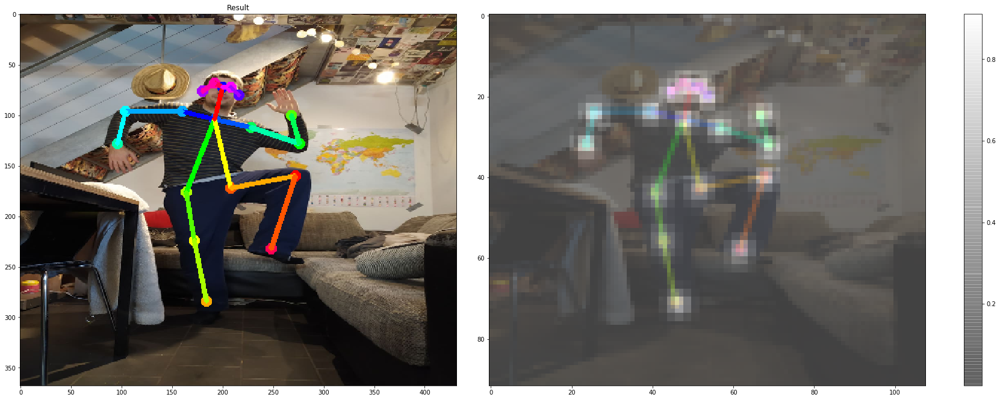

In [5]:
human_target = estimator.inference(image_target, resize_to_default=True, upsample_size=resize_out_ratio)
plot_pose(image_target, human_target, estimator.heatMat)

In [ ]:
EPS = 5000
STEPS = 300
STAGE_INDEX = 6 # range from 2 to 6
BATCH_SIZE = 16

if not "training_stats" in vars():
    # where does the current batch start
    training_stats = {
        'batch_index': 0,
        'image_index': 0,
        'universal_noise': np.zeros(image_target.shape),
        'file_name': f'snapshots/op_universal_noise_{datetime.datetime.now().strftime("%Y%m%d-%H%M%S")}.npy'
    }

target_heat = tf.compat.v1.placeholder(tf.float32, shape=(None, None, None, 19))
target_paf = tf.compat.v1.placeholder(tf.float32, shape=(None, None, None, 38))
grad_func, loss_func = multi_stage_loss_batch(target_heat, target_paf, STAGE_INDEX)

for i in tqdm(range(STEPS)):
    # load a batch 
    batch, training_stats['batch_index'] = load_batch(training_paths, training_stats['batch_index'], BATCH_SIZE)
    target_heat_batch = np.repeat(target_np[:, :, :, :19], BATCH_SIZE, 0)
    target_paf_batch = np.repeat(target_np[:, :, :, 19:], BATCH_SIZE, 0)
    
    repeated_noise = np.repeat(np.expand_dims(training_stats['universal_noise'], axis=0), BATCH_SIZE, 0)
    batch_with_noise = batch + repeated_noise
    
    gradient, gn_summ = estimator.persistent_sess.run(
                    [grad_func, loss_func],
                    feed_dict={
                        target_heat: target_heat_batch,
                        target_paf: target_paf_batch,
                        estimator.tensor_image: batch_with_noise,
                        estimator.upsample_size: upsample_size
                    }
                )
    summary_writer.add_summary(gn_summ, training_stats['image_index'])
    
    
    if i % 10 == 0:
        # Prepare the plot
        plot_buf = gen_plot_universal_noise(training_stats['universal_noise'])

        # Convert PNG buffer to TF image
        tf_image = tf.image.decode_png(plot_buf.getvalue(), channels=4)

        # Add the batch dimension
        tf_image = tf.expand_dims(tf_image, 0)

        # Add image summary
        summary_op = tf.summary.image(f"universal_noise_step{training_stats['image_index']}", tf_image)
        summary_img = estimator.persistent_sess.run(summary_op)
        # Write summary
    
        summary_writer.add_summary(summary_img)
        summary_writer.flush()
    if i % 25 == 0:
        # save universal noise
        np.save(training_stats['file_name'], training_stats['universal_noise'])
    
    ### ================= UPDATE STEP ================= ###
    #adv_image = adv_image - EPS * np.sign(gradient[0])
    scaled_gradient =  (EPS * gradient)
    training_stats['universal_noise'] = training_stats['universal_noise'] - scaled_gradient
    training_stats['universal_noise'] = np.clip(training_stats['universal_noise'], 0, 255)
    
    training_stats['image_index'] += 1
    

summary_writer.flush()


 49%|████▉     | 148/300 [1:22:14<1:24:28, 33.34s/it]


 67%|██████▋   | 200/300 [1:51:09<55:34, 33.35s/it]/cluster/home/alelidis/.local/lib64/python3.6/site-packages/ipykernel_launcher.py:101: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

 85%|████████▌ | 255/300 [2:21:47<25:01, 33.36s/it]

Min: 0.0
Max: 255.0
Avg: 17.236561527471775


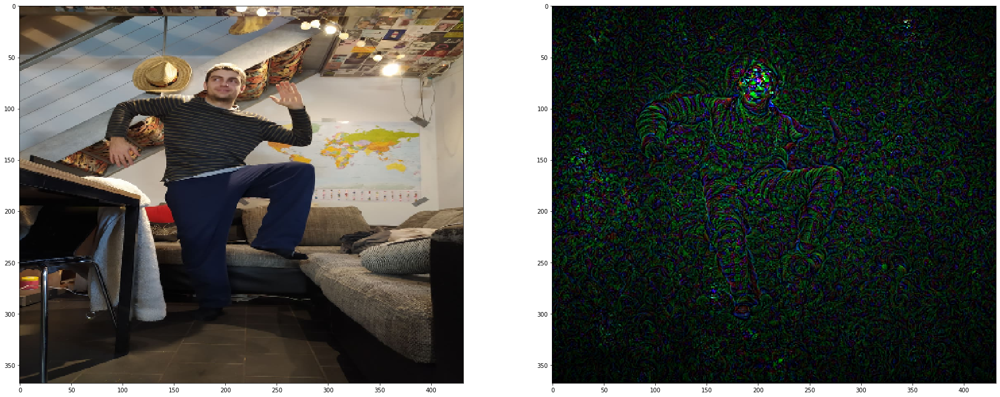

In [12]:
print_image_Stats(training_stats['universal_noise'])
fig = plt.figure(figsize=(30, 30))
ax = fig.add_subplot(1, 2, 1)
ax.imshow(cv2.cvtColor(image_target, cv2.COLOR_BGR2RGB))
ax = fig.add_subplot(1, 2, 2)
ax.imshow(np.clip(training_stats['universal_noise'], 0, 255) / 255)

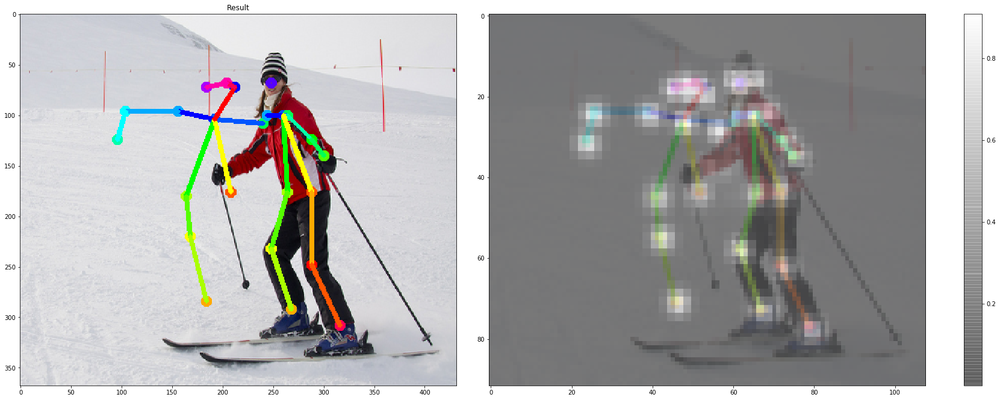

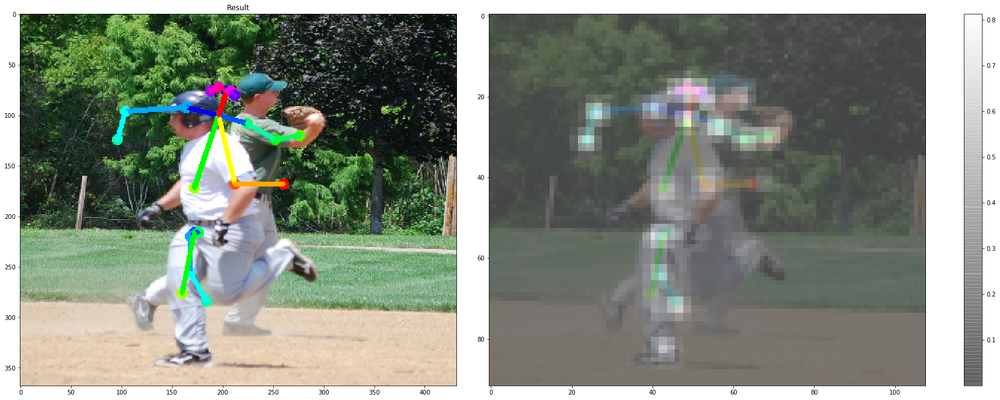

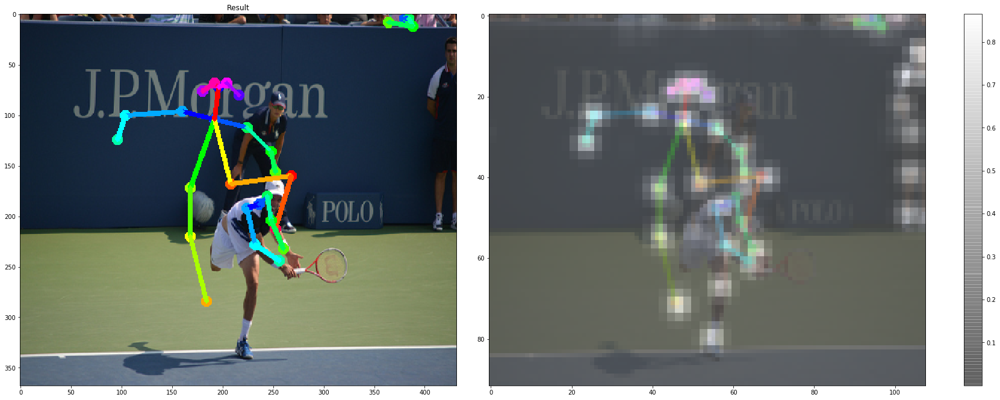

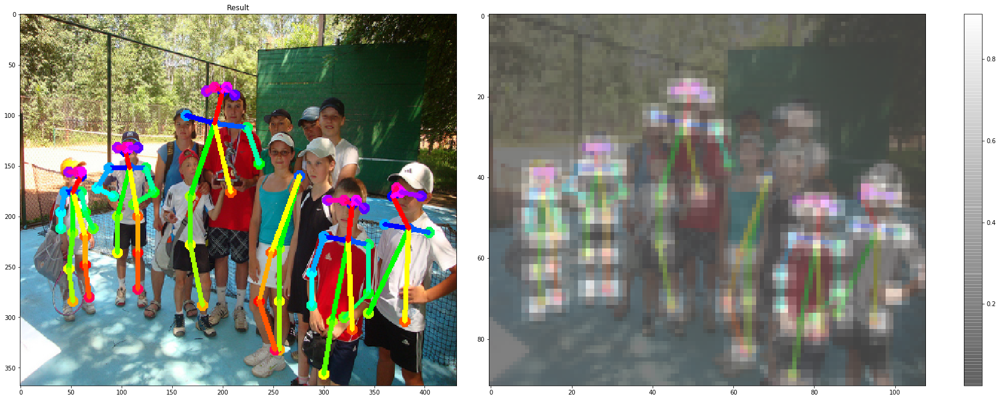

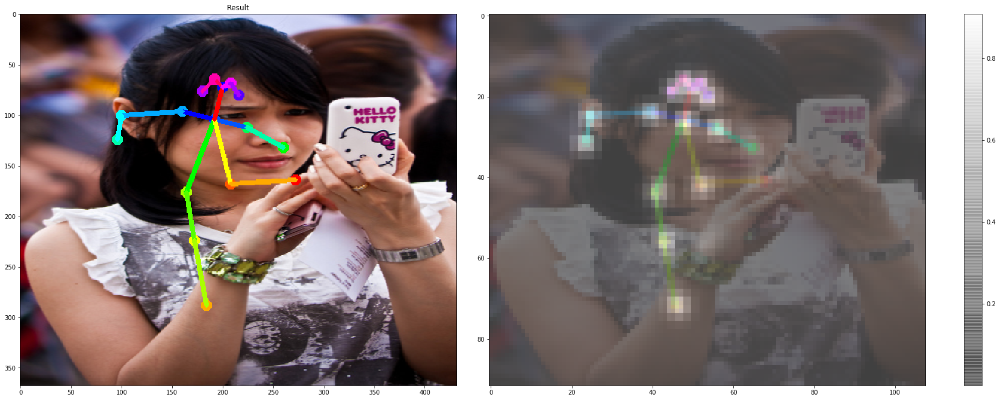

...

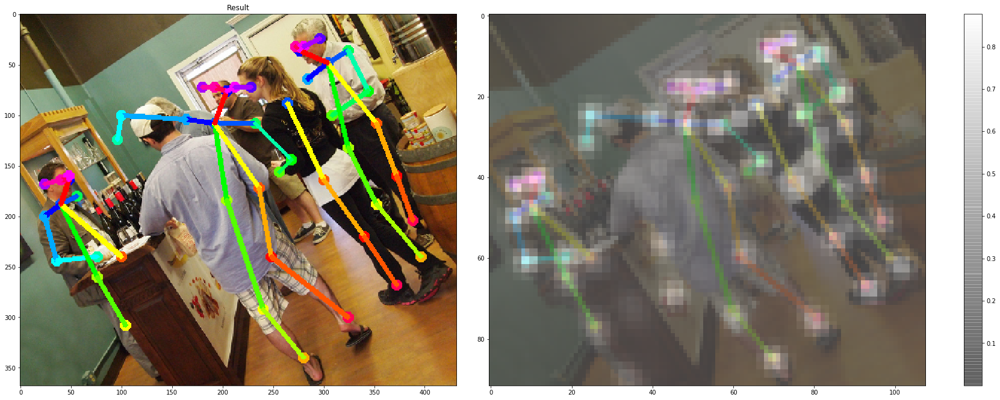

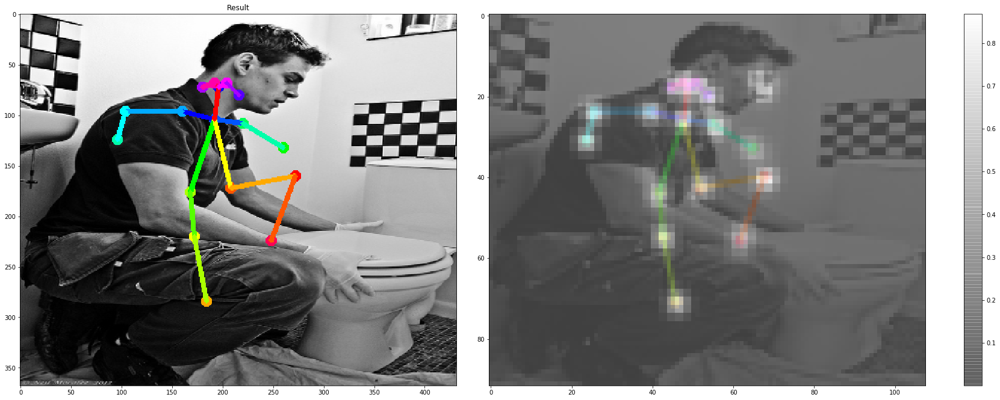

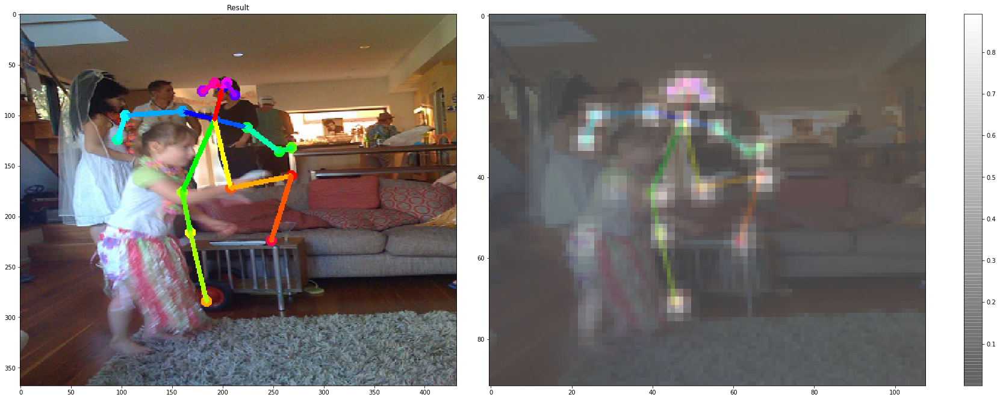

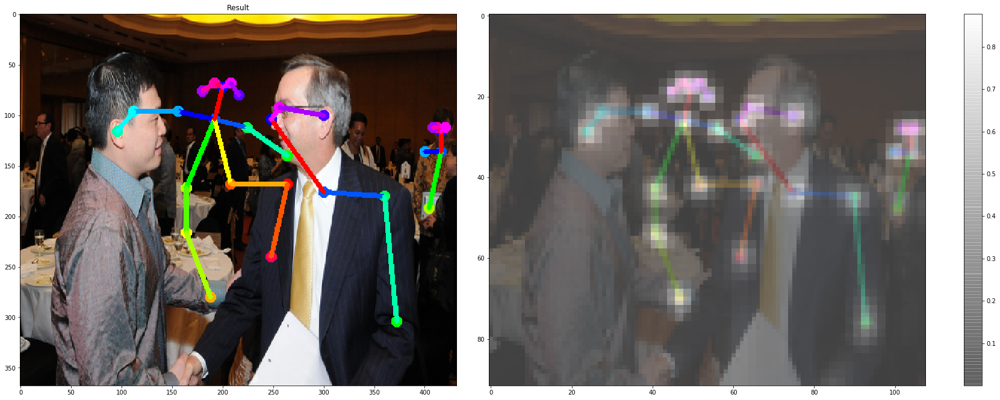

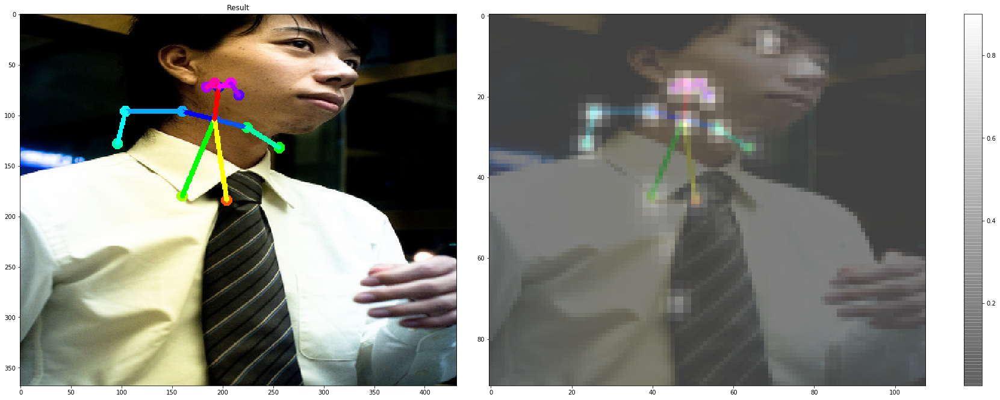

In [9]:
batch, batch_index = load_batch(training_paths, 0, BATCH_SIZE)

for i, image in enumerate(batch):
    test_image = np.clip(image + training_stats['universal_noise'], 0, 255) 
    detections = estimator.inference(test_image, resize_to_default=True, upsample_size=resize_out_ratio)
    plot_pose(image, detections, estimator.heatMat)

In [10]:
for i, image in enumerate(batch):   
    test_image = np.clip(cv2.cvtColor(batch[i], cv2.COLOR_BGR2RGB) + training_stats.universal_noise, 0, 255) / 255
    fig = plt.figure(figsize=(50, 25))

    ax = fig.add_subplot(1, 2, 1)
    ax.imshow(cv2.cvtColor(batch[i], cv2.COLOR_BGR2RGB))
    ax = fig.add_subplot(1, 2, 2)
    ax.imshow(test_image)

AttributeError: 'dict' object has no attribute 'universal_noise'

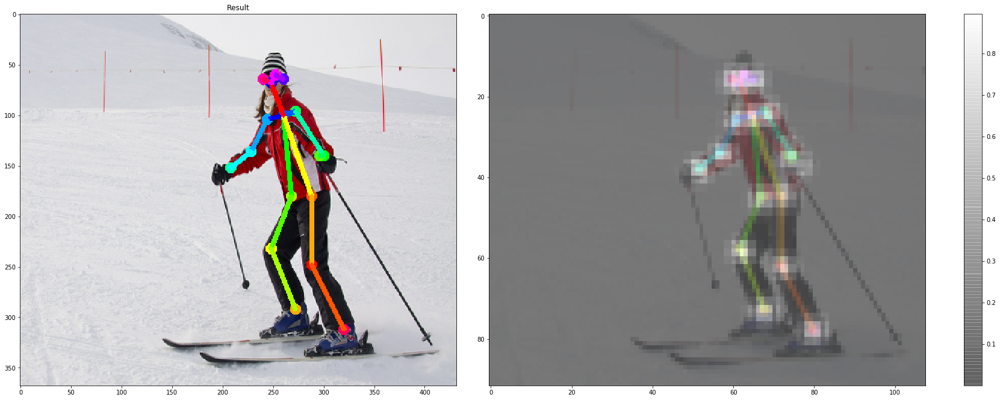

In [31]:
human_batch = estimator.inference(batch[0], resize_to_default=True, upsample_size=resize_out_ratio)
plot_pose(batch[0], human_batch, estimator.heatMat)